# Explainable AI project - Part 2 : Explanations
### Randomized Input Sampling for Explanation of Black-box Models : **RISE**
An implementation on [Imagenette](https://s3.amazonaws.com/fast-ai-imageclas/imagenette2.tgz) a subset of ImageNet with 10 classes.

### 1. Loading dataset

In [1]:
import torchvision
import torchvision.transforms as transforms
import torch
import os
from torch.utils.data import Dataset


means, stds = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
train_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds),
    ])

test_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds),
    ])

def get_imagenette2_loaders(root_path='./imagenette2', **kwargs):

    trainset = torchvision.datasets.ImageFolder(os.path.join(root_path, "train"), transform=train_transform)
    trainloader = torch.utils.data.DataLoader(trainset, **kwargs)
    testset = torchvision.datasets.ImageFolder(os.path.join(root_path, "val"), transform=test_transform)
    testloader = torch.utils.data.DataLoader(testset, **kwargs)
    return trainloader, testloader

trainloader, testloader = get_imagenette2_loaders( batch_size=64, shuffle=True, num_workers=2)

labels = ['tench', 'touti touts', 'cassette player', 'chain saw', 'church', 'French horn', 'garbage truck', 'gas pump', 'golf ball', 'parachute']

inv_normalize = transforms.Normalize(
   mean= [-m/s for m,s in zip(means, stds)],
   std= [1/s for s in stds]
)

### 2. Loading tuned ResNet-34

/home/tortank-el-famoso/miniconda3/envs/XAI/lib/python3.11/site-packages/transformers/models/convnext/feature_extraction_convnext.py:28: FutureWarning: The class ConvNextFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ConvNextImageProcessor instead.
  warnings.warn(


Prediction : French horn
Real label : French horn


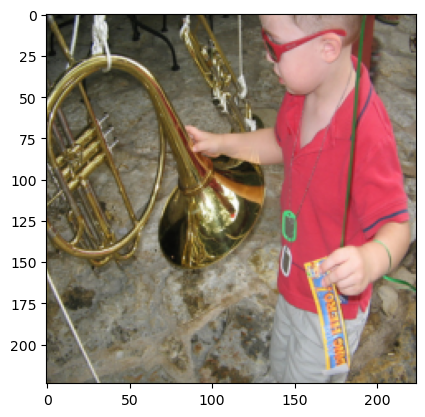

In [2]:
from transformers import AutoFeatureExtractor, ResNetForImageClassification
import matplotlib.pyplot as plt
import torch.nn as nn


x, label_train = next(iter(trainloader))
image = inv_normalize(x[0])
plt.imshow(inv_normalize(x[0]).permute(1, 2, 0))

feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/resnet-34")
model_resnet = ResNetForImageClassification.from_pretrained("microsoft/resnet-34")

# Modify the classification layer to have 10 classes
num_features = model_resnet.classifier[1].in_features

classifier = nn.Sequential(
    nn.Flatten(start_dim=1, end_dim=-1),
    nn.Linear(num_features, 10)
)

model_resnet.classifier = classifier

model_resnet.load_state_dict(torch.load('resnet_34_10_classes_v4.pth'))
model_resnet.eval()

with torch.no_grad():
    logits = model_resnet(image.unsqueeze_(0)).logits

# model predicts one of the 10 classes
predicted_label = logits.argmax(-1).item()

print('Prediction : ' + labels[predicted_label])
print('Real label : ' + labels[label_train[0]])


### 3. Loading tuned MobileOne

Prediction : cassette player
Real label : cassette player


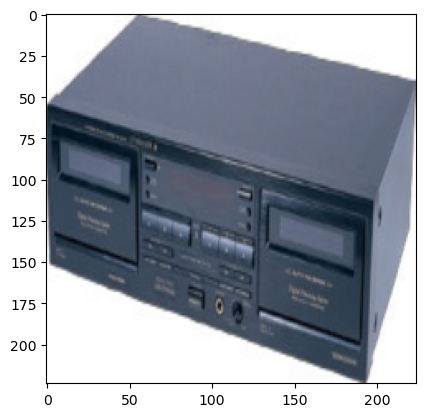

In [3]:
from mobileone import mobileone, reparameterize_model

x, label_train = next(iter(trainloader))
image = inv_normalize(x[0])
plt.imshow(inv_normalize(x[0]).permute(1, 2, 0))

# Load Pre-trained checkpoint for fine-tuning
model_mobileone = mobileone(variant='s1')
checkpoint = torch.load('mobileone_s1_unfused.pth.tar', map_location=torch.device('cpu'))
model_mobileone.load_state_dict(checkpoint)

# Change the number of classes in the linear layer to 10
model_mobileone.linear = nn.Linear(in_features=model_mobileone.linear.in_features, out_features=10)

# For inference
model_mobileone.load_state_dict(torch.load('mobileone.pth'))
model_mobileone.eval()
model_mobileone_eval = reparameterize_model(model_mobileone)

with torch.no_grad():
    logits = model_mobileone_eval(image.unsqueeze_(0))

# model predicts one of the 10 classes
predicted_label = logits.argmax(-1).item()

print('Prediction : ' + labels[predicted_label])
print('Real label : ' + labels[label_train[0]])

### 4. Explanations
We used Grad-CAM, LIME and RISE to explain the MobileOne and ResNet-34 we tuned using transfer learning.

For each class, we use the three methods on one example to generate a saliency or importance map that shows how important each image pixel is for the
network’s prediction.

#### 4.1. RISE implementation

RISE is implemented as follows :
* Masked images generation (see the plot below)
* Calculation of saliency or importance map using masks and model predictions on masked images
* Ploting saliency map
* Calculating insertion and deletion metrics 

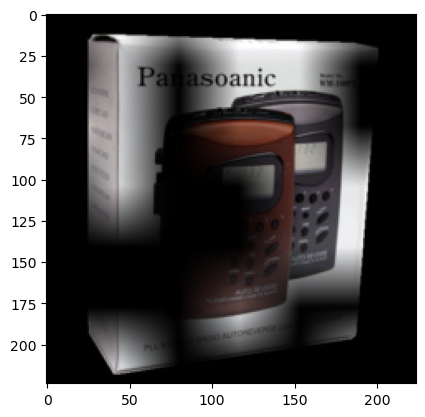

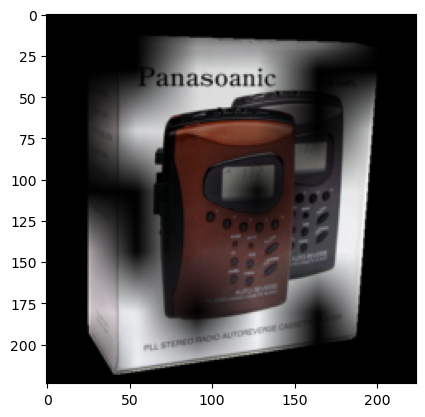

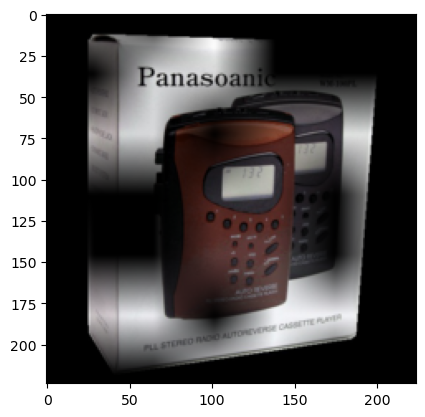

100%|██████████| 1000/1000 [00:37<00:00, 26.35it/s]


In [35]:
from rise import generate_masks, rise_map
import matplotlib.pyplot as plt
from tqdm import tqdm

N = 1000
p = 0.5

images, labels = next(iter(testloader))
_, W, H = images[0].shape

#print(image[0])

masks = generate_masks(N, p, H, W)

for mask in masks[:3] :

    plt.imshow((inv_normalize(images[0]) * mask).permute(1, 2, 0))
    plt.show()

image = inv_normalize(images[0])
label = labels[0]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_resnet.to(device)
image.to(device)
masks.to(device)

saliency_map = rise_map(model=model_resnet, label=label, image=image, p=p, masks=masks)

Here we can see 3 masked images exemple that have been used to test model prediction impact on predicting the label predicted with the whole image

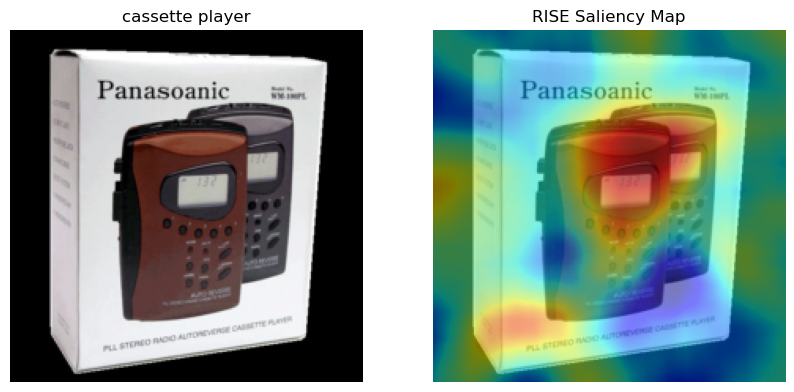

In [36]:
from rise import plot_saliency_map

labels = ['tench', 'touti touts', 'cassette player', 'chain saw', 'church', 'French horn', 'garbage truck', 'gas pump', 'golf ball', 'parachute']
label_title = labels[label]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Plot the original image on the first axes
ax1.imshow(image.permute(1, 2, 0).numpy())
ax1.set_title(label_title)
ax1.axis('off')

# Use the modified plot_saliency_map function to plot on the second axes
plot_saliency_map(ax2, image, saliency_map)

# Display the composite figure
plt.show()

Now we have calculated the saliency map, we can caculate insertion and deletion metrics.

Below, we show the saliency map and the metrics on MobileOne model 

  0%|          | 0/1000 [00:00<?, ?it/s]

100%|██████████| 1000/1000 [00:44<00:00, 22.55it/s]


tensor([1.8182e-05, 1.8180e-05, 1.8181e-05,  ..., 1.8503e-05, 1.8497e-05,
        1.8494e-05])


100%|██████████| 502/502 [00:20<00:00, 25.03it/s]


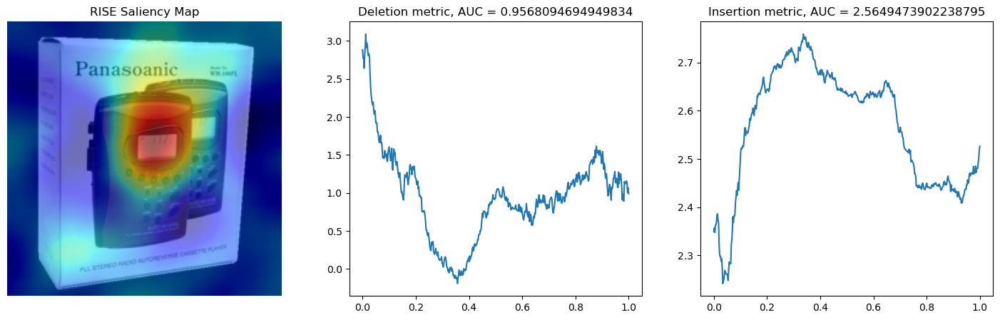

In [38]:
import rise

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
metric = rise.analysis(ax1, image, label, model_mobileone, masks)

# Deletion metric plot
ax2.plot(metric['deletion']['x_axis'], metric['deletion']['scores'])
ax2.set_title('Deletion metric, AUC = ' + str(metric['deletion']['auc']))

# Insertion metric plot
ax3.plot(metric['insertion']['x_axis'], metric['insertion']['scores'])
ax3.set_title('Insertion metric, AUC = ' + str(metric['insertion']['auc']))

plt.show()

#### 4.2 LIME and GradCAM implementation

  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([1, 1, 1,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:52<00:00,  9.64it/s]


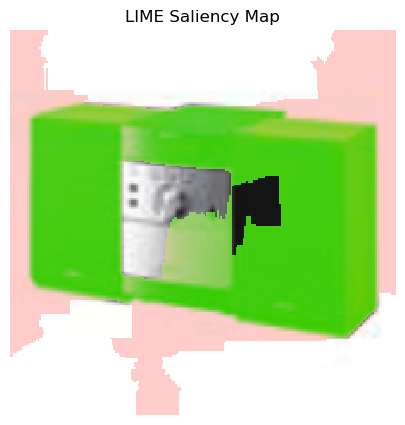

In [8]:
lime_transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(means, stds),
    ])

def batch_predict_mobileone(images):
  with torch.no_grad():
    model_mobileone.eval()
    batch = torch.stack(tuple(lime_transform(i) for i in images), dim=0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    batch = batch.to(device)
    logits = model_mobileone(batch)
  return logits.detach().cpu().numpy()


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
metric = limon.analysis(ax1, image, label, model_mobileone, batch_predict_mobileone)

# Deletion metric plot
ax2.plot(metric['deletion']['x_axis'], metric['deletion']['scores'])
ax2.set_title('Deletion metric, AUC = ' + str(metric['insertion']['auc']))

# Insertion metric plot
ax3.plot(metric['insertion']['x_axis'], metric['insertion']['scores'])
ax3.set_title('Insertion metric, AUC = ' + str(metric['insertion']['auc']))

plt.show()


tensor([0.2412, 0.2490, 0.2569,  ..., 0.4333, 0.4412, 0.4490],
       dtype=torch.float64)


100%|██████████| 502/502 [00:48<00:00, 10.42it/s]


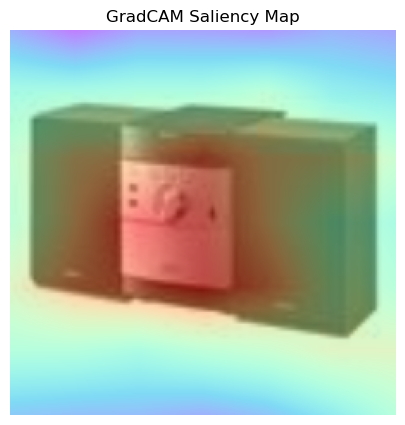

In [10]:
import gradcam

hook_mobileone = gradcam.HookFeatures(model_mobileone.stage4[1].rbr_conv[0].conv)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
metric = gradcam.analysis(ax1, image, label, model_mobileone, hook_mobileone)

# Deletion metric plot
ax2.plot(metric['deletion']['x_axis'], metric['deletion']['scores'])
ax2.set_title('Deletion metric, AUC = ' + str(metric['insertion']['auc']))

# Insertion metric plot
ax3.plot(metric['insertion']['x_axis'], metric['insertion']['scores'])
ax3.set_title('Insertion metric, AUC = ' + str(metric['insertion']['auc']))

plt.show()

hook_mobileone.close()

### 5. Explanations of the two models on 3 classes

Now we use each one of the three explanation methods : **RISE**, **LIME** and **GradCAM** to explain the two models predictions on 3 classes :
* dog
* church
* parachute

For each class we used 4 examples for calculation time reduction and analysis simplification. To look for our analysis on given explanations, please scroll down to part **5.3.**

The evaluation with the metrics will be done in another notebook : `XAI_evaluation.ipynb`.

In [17]:
from tools import find_examples_per_class
import pickle


labels = ['tench', 'dog', 'cassette player', 'chain saw', 'church', 'French horn', 'garbage truck', 'gas pump', 'golf ball', 'parachute']
selected_classes = [1, 4, 9] # selected dog, church and parachute
example_class_dict = find_examples_per_class(testloader, selected_classes, labs = labels, examples_per_class=4)

with open('example_class_dictionary.pkl', 'wb') as f:
    pickle.dump(example_class_dict, f)

explanation_dict = {}

#### 5.1. ResNet-34 Importance maps

RISE


100%|██████████| 2000/2000 [01:11<00:00, 27.92it/s]


tensor([-4.8681e-05, -4.8669e-05, -4.8652e-05,  ..., -5.0564e-05,
        -5.0555e-05, -5.0546e-05])


100%|██████████| 502/502 [00:18<00:00, 27.54it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 1, 1, 1])


100%|██████████| 502/502 [00:18<00:00, 27.68it/s]


GradCAM
tensor([0.5000, 0.5000, 0.5000,  ..., 0.5000, 0.5000, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:18<00:00, 27.36it/s]


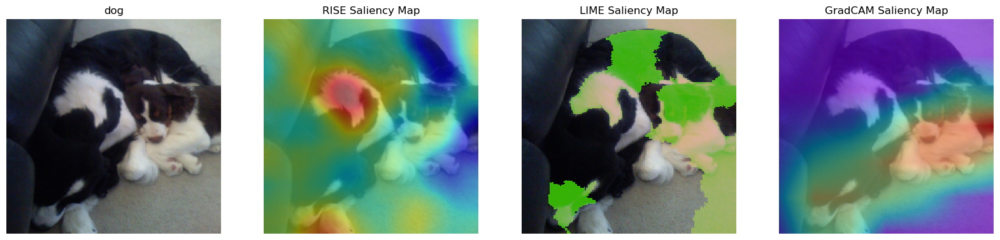

RISE


100%|██████████| 2000/2000 [01:15<00:00, 26.34it/s]


tensor([-3.9492e-05, -3.9483e-05, -3.9471e-05,  ..., -3.9517e-05,
        -3.9550e-05, -3.9576e-05])


100%|██████████| 502/502 [00:17<00:00, 28.47it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:19<00:00, 25.35it/s]


GradCAM
tensor([0.5000, 0.5000, 0.5000,  ..., 0.5000, 0.5000, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:18<00:00, 26.47it/s]


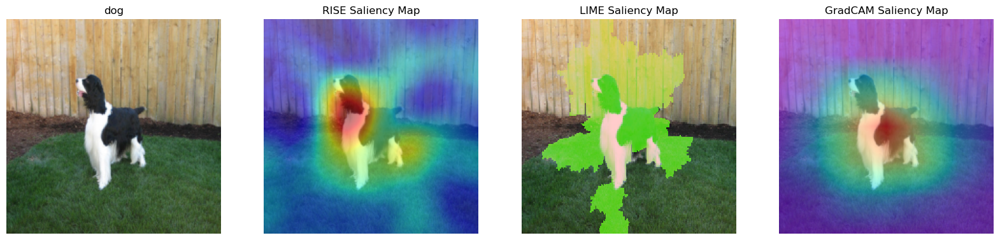

RISE


100%|██████████| 2000/2000 [01:19<00:00, 25.06it/s]


tensor([-5.4399e-05, -5.4396e-05, -5.4391e-05,  ..., -5.4562e-05,
        -5.4563e-05, -5.4561e-05])


100%|██████████| 502/502 [00:19<00:00, 25.97it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:18<00:00, 26.77it/s]


GradCAM
tensor([0.5000, 0.5000, 0.5000,  ..., 0.5000, 0.5000, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:19<00:00, 26.11it/s]


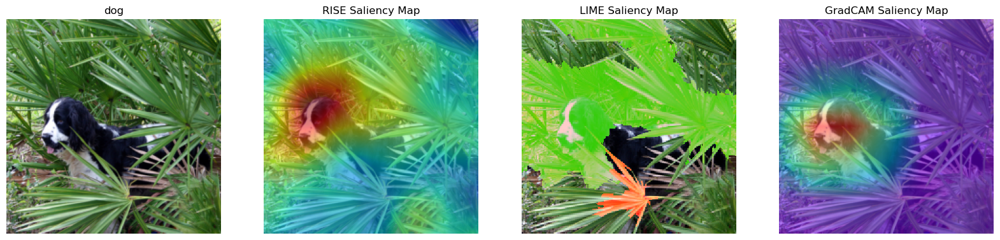

RISE


100%|██████████| 2000/2000 [01:20<00:00, 24.74it/s]


tensor([-3.8258e-05, -3.8272e-05, -3.8287e-05,  ..., -3.9621e-05,
        -3.9601e-05, -3.9580e-05])


100%|██████████| 502/502 [00:18<00:00, 26.72it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:19<00:00, 25.46it/s]


GradCAM
tensor([0.5000, 0.5000, 0.5000,  ..., 0.5000, 0.5000, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:18<00:00, 27.11it/s]


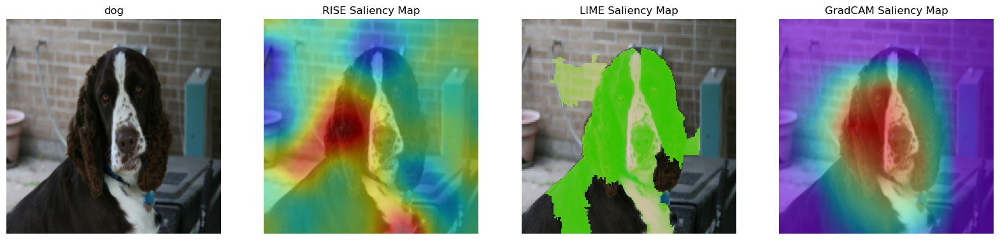

RISE


100%|██████████| 2000/2000 [01:16<00:00, 26.12it/s]


tensor([-3.7417e-05, -3.7453e-05, -3.7488e-05,  ..., -4.0095e-05,
        -4.0131e-05, -4.0162e-05])


100%|██████████| 502/502 [00:18<00:00, 27.18it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([1, 1, 1,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:17<00:00, 28.22it/s]


GradCAM
tensor([0.1314, 0.1392, 0.1392,  ..., 0.1039, 0.1039, 0.0961],
       dtype=torch.float64)


100%|██████████| 502/502 [00:18<00:00, 27.89it/s]


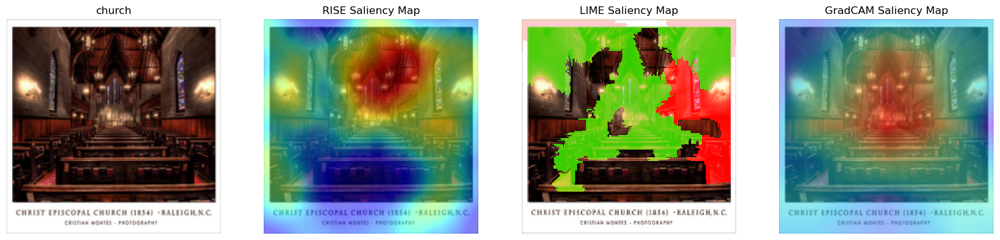

RISE


100%|██████████| 2000/2000 [01:16<00:00, 26.23it/s]


tensor([3.3782e-05, 3.3780e-05, 3.3776e-05,  ..., 3.3644e-05, 3.3616e-05,
        3.3590e-05])


100%|██████████| 502/502 [00:18<00:00, 27.06it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:19<00:00, 26.09it/s]


GradCAM
tensor([0.5000, 0.5000, 0.5000,  ..., 0.4059, 0.4059, 0.3980],
       dtype=torch.float64)


100%|██████████| 502/502 [00:18<00:00, 27.33it/s]


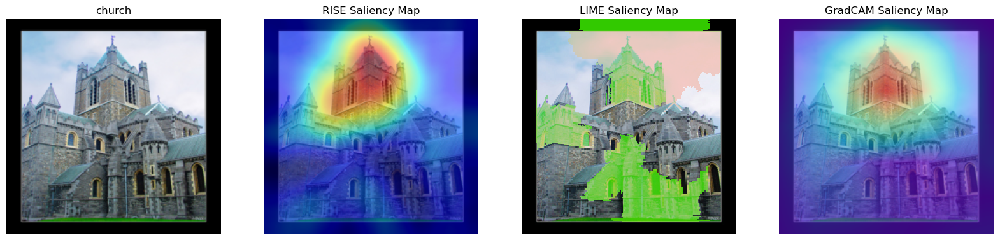

RISE


100%|██████████| 2000/2000 [01:16<00:00, 26.07it/s]


tensor([-2.6781e-05, -2.6772e-05, -2.6758e-05,  ..., -2.4729e-05,
        -2.4768e-05, -2.4805e-05])


100%|██████████| 502/502 [00:18<00:00, 27.10it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([-1, -1, -1,  ...,  0,  0,  0])


100%|██████████| 502/502 [00:18<00:00, 26.99it/s]


GradCAM
tensor([0.5000, 0.5000, 0.5000,  ..., 0.5000, 0.5000, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:17<00:00, 28.90it/s]


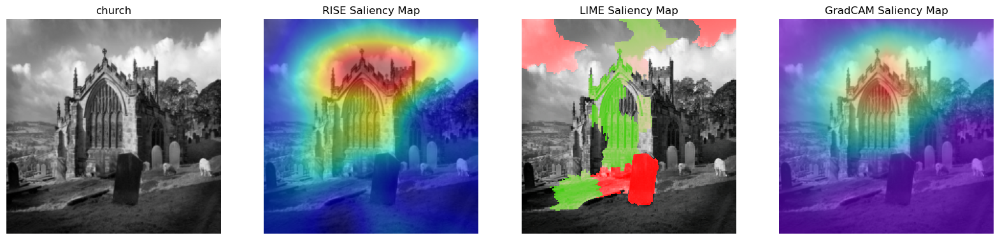

RISE


100%|██████████| 2000/2000 [01:17<00:00, 25.65it/s]


tensor([-4.4080e-05, -4.4061e-05, -4.4038e-05,  ..., -4.4647e-05,
        -4.4663e-05, -4.4671e-05])


100%|██████████| 502/502 [00:18<00:00, 27.21it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([ 1,  1,  1,  ..., -1, -1, -1])


100%|██████████| 502/502 [00:17<00:00, 27.93it/s]


GradCAM
tensor([0.4686, 0.4686, 0.4686,  ..., 0.5000, 0.5000, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:18<00:00, 27.41it/s]


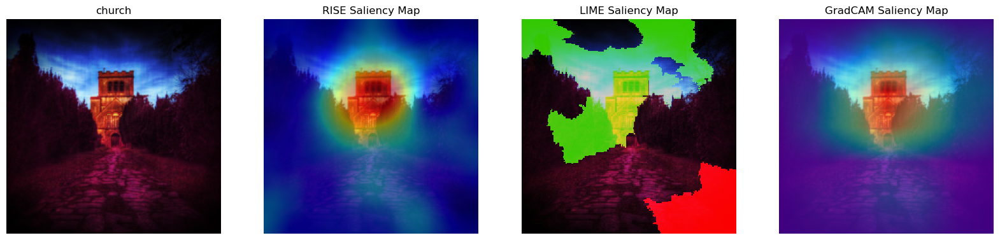

RISE


100%|██████████| 2000/2000 [01:15<00:00, 26.56it/s]


tensor([2.8385e-05, 2.8375e-05, 2.8365e-05,  ..., 2.7795e-05, 2.7787e-05,
        2.7779e-05])


100%|██████████| 502/502 [00:18<00:00, 27.16it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:18<00:00, 27.16it/s]


GradCAM
tensor([0.4059, 0.3980, 0.3902,  ..., 0.5000, 0.5000, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:17<00:00, 27.93it/s]


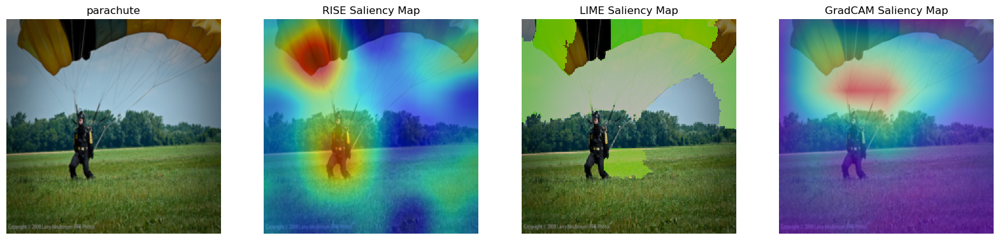

RISE


100%|██████████| 2000/2000 [01:19<00:00, 25.18it/s]


tensor([8.8997e-06, 8.8997e-06, 8.8988e-06,  ..., 8.2913e-06, 8.2714e-06,
        8.2570e-06])


100%|██████████| 502/502 [00:19<00:00, 26.15it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:19<00:00, 26.16it/s]


GradCAM
tensor([0.3902, 0.3902, 0.3902,  ..., 0.3353, 0.3353, 0.3353],
       dtype=torch.float64)


100%|██████████| 502/502 [00:18<00:00, 26.65it/s]


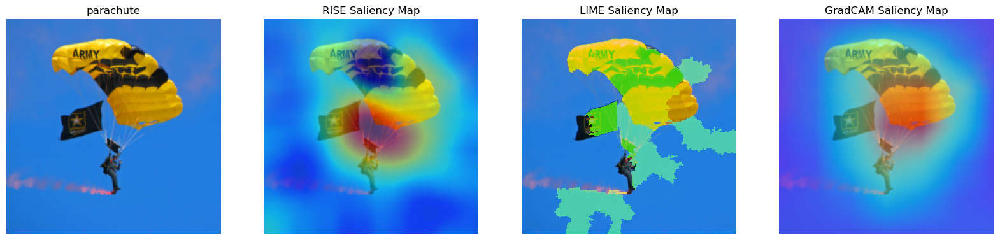

RISE


100%|██████████| 2000/2000 [01:18<00:00, 25.36it/s]


tensor([9.3009e-06, 9.3168e-06, 9.3336e-06,  ..., 9.2604e-06, 9.2517e-06,
        9.2425e-06])


100%|██████████| 502/502 [00:19<00:00, 26.35it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:18<00:00, 26.80it/s]


GradCAM
tensor([0.2412, 0.2333, 0.2176,  ..., 0.3275, 0.3275, 0.3275],
       dtype=torch.float64)


100%|██████████| 502/502 [00:19<00:00, 25.31it/s]


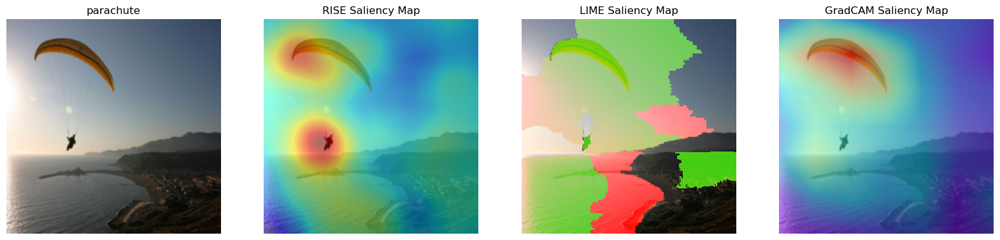

RISE


100%|██████████| 2000/2000 [01:25<00:00, 23.28it/s]


tensor([-1.7262e-05, -1.7262e-05, -1.7259e-05,  ..., -1.5821e-05,
        -1.5834e-05, -1.5845e-05])


100%|██████████| 502/502 [00:19<00:00, 25.26it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([ 0,  0,  0,  ...,  0,  0, -1])


100%|██████████| 502/502 [00:19<00:00, 25.16it/s]


GradCAM
tensor([0.5000, 0.5000, 0.5000,  ..., 0.4294, 0.4294, 0.4294],
       dtype=torch.float64)


100%|██████████| 502/502 [00:19<00:00, 25.79it/s]


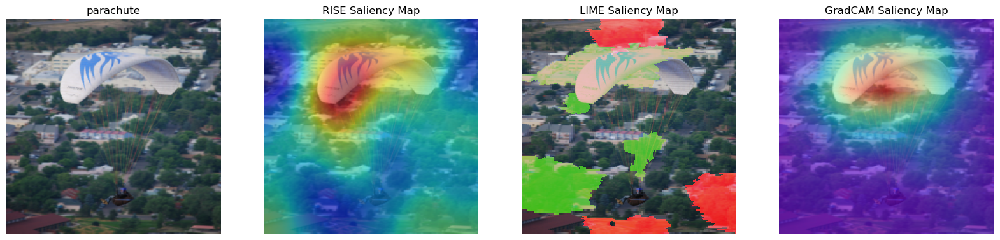

In [19]:
import limon
import torch.nn.functional as F
from torchvision.transforms import transforms
import gradcam
import rise

# Initialisation
labels = ['tench', 'dog', 'cassette player', 'chain saw', 'church', 'French horn', 'garbage truck', 'gas pump', 'golf ball', 'parachute']
resnet_dict = {}

inv_normalize = transforms.Normalize(
   mean= [-m/s for m,s in zip(means, stds)],
   std= [1/s for s in stds]
)
#
#image = inv_normalize(image_example)
#
N = 2000
p = 0.5
images, _ = next(iter(testloader))
_, W, H = images[0].shape
masks = rise.generate_masks(N, p, H, W)


lime_transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(means, stds),
    ])

def batch_predict_resnet(images):
  with torch.no_grad():
    model_resnet.eval()
    batch = torch.stack(tuple(lime_transform(i) for i in images), dim=0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    batch = batch.to(device)
    logits = model_resnet(batch).logits
  return logits.detach().cpu().numpy()

# Explanation analysis

for label in example_class_dict.keys() :
    lab = labels.index(label)
    class_dict = {}
    for i,img in enumerate(example_class_dict[label]) :
      image = inv_normalize(img)

      fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 5))
      ax1.imshow(image.permute(1, 2, 0).numpy())
      ax1.set_title(label)
      ax1.axis('off')

      print('RISE')
      metric_rise = rise.analysis(ax2, image, lab, model_resnet, masks)
      print('LIME')
      metric_lime = limon.analysis(ax3, image, lab, model_resnet, batch_predict_resnet)
      print('GradCAM')
      hook_resnet = gradcam.HookFeatures(model_resnet.resnet.encoder.stages[3].layers[2].activation)
      metric_gradcam = gradcam.analysis(ax4, image, lab, model_resnet, hook_resnet)
      hook_resnet.close()

      example_dict = {'rise' : metric_rise,
                      'lime' : metric_lime,
                      'gradcam' : metric_gradcam
                    }

      plt.show()

      class_dict[i] = example_dict

    resnet_dict[label] = class_dict

explanation_dict['resnet'] = resnet_dict
    




#### 5.2. MobileOne Importance maps

RISE


100%|██████████| 2000/2000 [01:35<00:00, 21.02it/s]


tensor([-2.9869e-05, -2.9856e-05, -2.9844e-05,  ..., -2.8955e-05,
        -2.8950e-05, -2.8945e-05])


100%|██████████| 502/502 [00:21<00:00, 23.47it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 1, 1, 1])


100%|██████████| 502/502 [00:22<00:00, 22.43it/s]


GradCAM
tensor([0.0765, 0.0843, 0.0922,  ..., 0.3745, 0.3745, 0.3745],
       dtype=torch.float64)


100%|██████████| 502/502 [00:21<00:00, 23.21it/s]


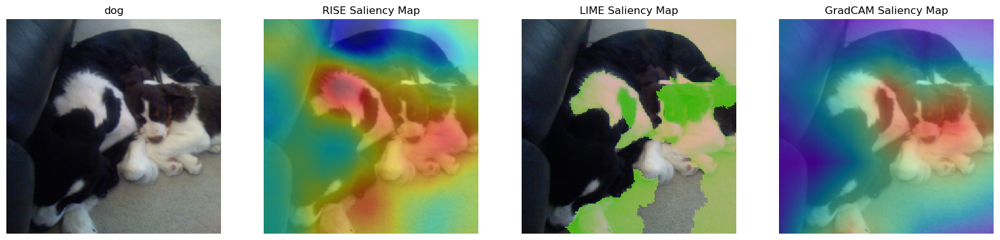

RISE


100%|██████████| 2000/2000 [01:32<00:00, 21.70it/s]


tensor([-2.6855e-05, -2.6842e-05, -2.6832e-05,  ..., -2.5927e-05,
        -2.5948e-05, -2.5973e-05])


100%|██████████| 502/502 [00:20<00:00, 24.67it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([1, 1, 1,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:20<00:00, 24.63it/s]


GradCAM
tensor([0.3275, 0.3275, 0.3275,  ..., 0.3902, 0.3902, 0.3980],
       dtype=torch.float64)


100%|██████████| 502/502 [00:20<00:00, 24.99it/s]


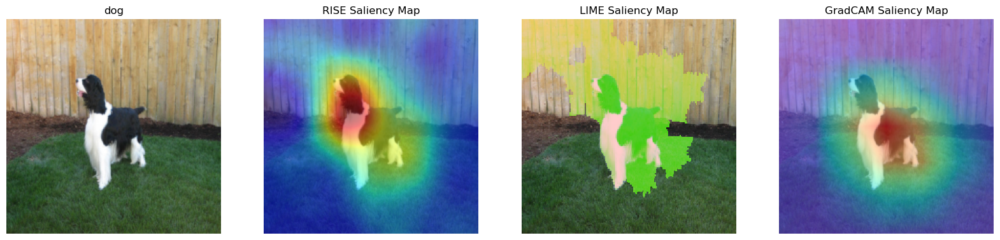

RISE


100%|██████████| 2000/2000 [01:28<00:00, 22.68it/s]


tensor([-4.6221e-05, -4.6205e-05, -4.6193e-05,  ..., -4.4762e-05,
        -4.4766e-05, -4.4767e-05])


100%|██████████| 502/502 [00:19<00:00, 25.66it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:23<00:00, 21.78it/s]


GradCAM
tensor([0.1235, 0.1235, 0.1235,  ..., 0.2412, 0.2490, 0.2490],
       dtype=torch.float64)


100%|██████████| 502/502 [00:22<00:00, 22.81it/s]


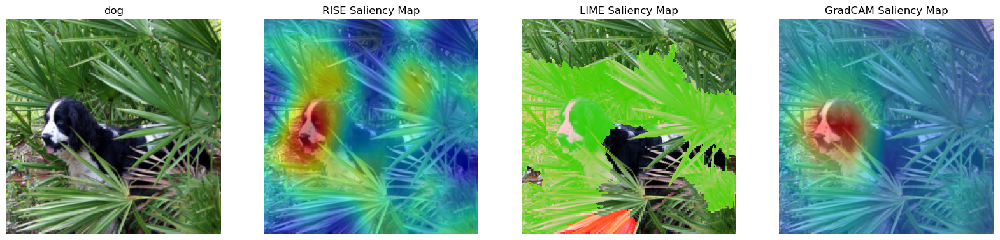

RISE


100%|██████████| 2000/2000 [01:30<00:00, 22.11it/s]


tensor([-5.7221e-05, -5.7215e-05, -5.7214e-05,  ..., -5.7008e-05,
        -5.6995e-05, -5.6979e-05])


100%|██████████| 502/502 [00:22<00:00, 22.56it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:21<00:00, 23.81it/s]


GradCAM
tensor([0.3196, 0.3196, 0.3196,  ..., 0.4765, 0.4922, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:18<00:00, 27.41it/s]


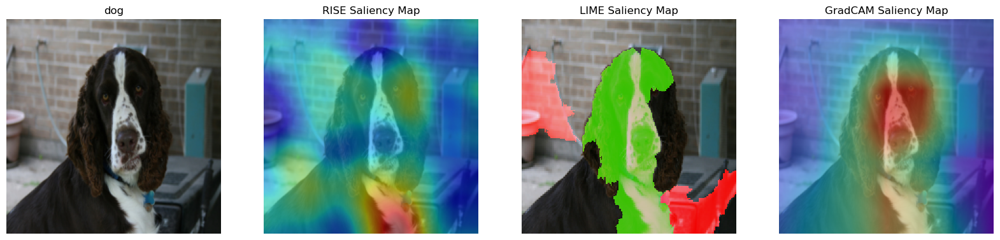

RISE


100%|██████████| 2000/2000 [01:25<00:00, 23.52it/s]


tensor([-7.5648e-05, -7.5625e-05, -7.5603e-05,  ..., -7.3046e-05,
        -7.3038e-05, -7.3030e-05])


100%|██████████| 502/502 [00:22<00:00, 22.09it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:21<00:00, 23.51it/s]


GradCAM
tensor([0.5000, 0.5000, 0.5000,  ..., 0.5000, 0.5000, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:20<00:00, 24.36it/s]


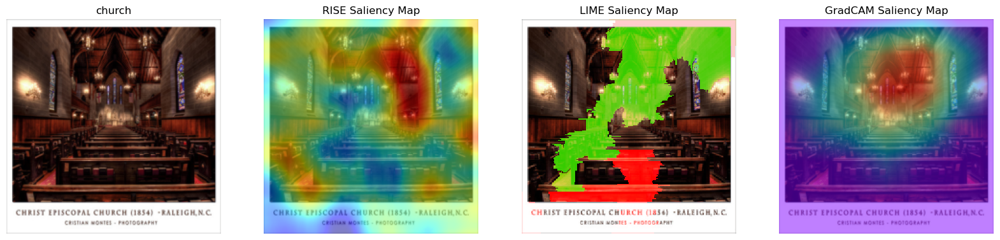

RISE


100%|██████████| 2000/2000 [01:22<00:00, 24.18it/s]


tensor([-9.5735e-06, -9.5790e-06, -9.5842e-06,  ..., -9.0095e-06,
        -9.0067e-06, -9.0058e-06])


100%|██████████| 502/502 [00:18<00:00, 26.89it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:19<00:00, 25.20it/s]


GradCAM
tensor([0.5000, 0.5000, 0.5000,  ..., 0.5000, 0.5000, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:19<00:00, 25.83it/s]


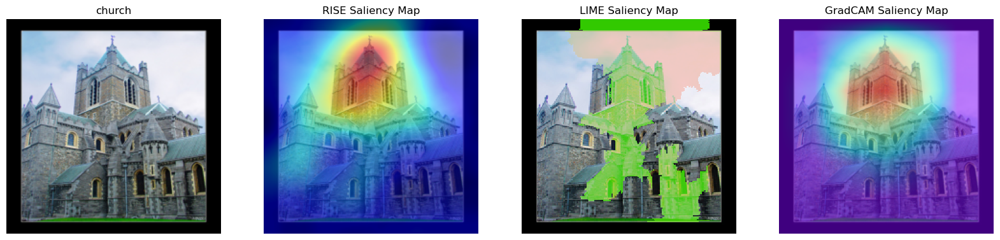

RISE


100%|██████████| 2000/2000 [01:29<00:00, 22.36it/s]


tensor([-1.2810e-06, -1.2811e-06, -1.2862e-06,  ..., -5.1301e-07,
        -4.8514e-07, -4.6338e-07])


100%|██████████| 502/502 [00:20<00:00, 24.48it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:23<00:00, 21.49it/s]


GradCAM
tensor([0.5000, 0.5000, 0.5000,  ..., 0.5000, 0.5000, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:22<00:00, 22.75it/s]


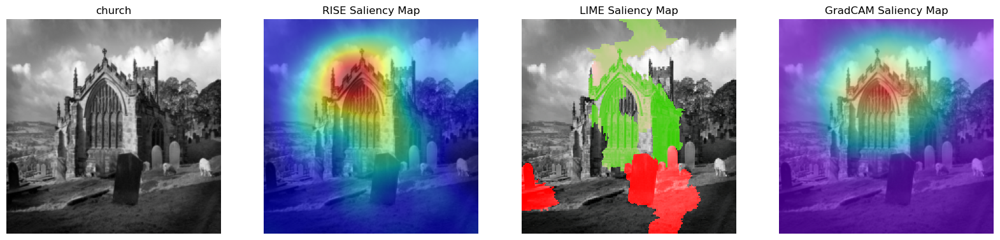

RISE


100%|██████████| 2000/2000 [01:25<00:00, 23.44it/s]


tensor([-1.2551e-05, -1.2566e-05, -1.2584e-05,  ..., -1.2727e-05,
        -1.2719e-05, -1.2712e-05])


100%|██████████| 502/502 [00:20<00:00, 24.17it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([1, 1, 1,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:21<00:00, 23.60it/s]


GradCAM
tensor([0.5000, 0.5000, 0.5000,  ..., 0.5000, 0.5000, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:22<00:00, 22.20it/s]


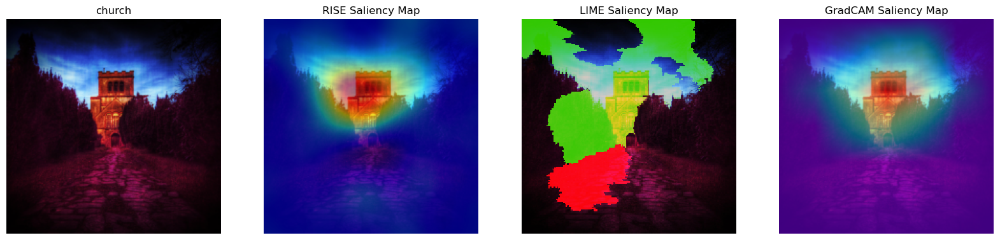

RISE


100%|██████████| 2000/2000 [01:29<00:00, 22.38it/s]


tensor([4.7355e-05, 4.7388e-05, 4.7424e-05,  ..., 4.3571e-05, 4.3571e-05,
        4.3567e-05])


100%|██████████| 502/502 [00:20<00:00, 24.21it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:20<00:00, 23.91it/s]


GradCAM
tensor([0.3431, 0.3353, 0.3196,  ..., 0.5000, 0.5000, 0.5000],
       dtype=torch.float64)


100%|██████████| 502/502 [00:20<00:00, 24.01it/s]


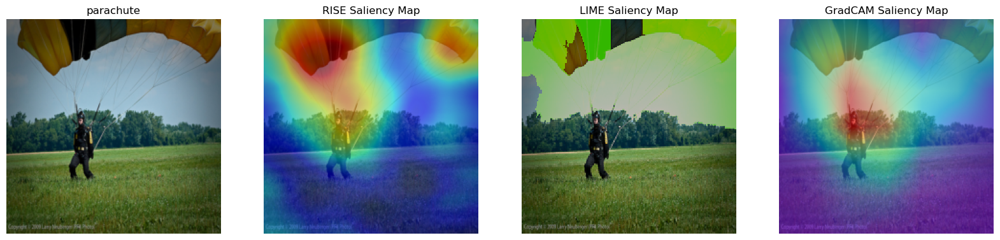

RISE


100%|██████████| 2000/2000 [01:29<00:00, 22.46it/s]


tensor([2.3712e-05, 2.3730e-05, 2.3748e-05,  ..., 2.2901e-05, 2.2904e-05,
        2.2904e-05])


100%|██████████| 502/502 [00:20<00:00, 24.23it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([0, 0, 0,  ..., 0, 0, 0])


100%|██████████| 502/502 [00:21<00:00, 23.40it/s]


GradCAM
tensor([0.5000, 0.5000, 0.5000,  ..., 0.4608, 0.4608, 0.4608],
       dtype=torch.float64)


100%|██████████| 502/502 [00:19<00:00, 25.80it/s]


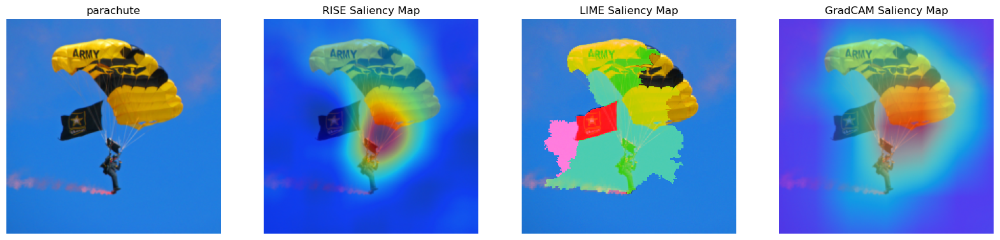

RISE


100%|██████████| 2000/2000 [01:26<00:00, 23.14it/s]


tensor([-4.7680e-06, -4.7445e-06, -4.7183e-06,  ..., -4.8018e-06,
        -4.7941e-06, -4.7877e-06])


100%|██████████| 502/502 [00:19<00:00, 26.15it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([ 1,  1,  1,  ..., -1, -1, -1])


100%|██████████| 502/502 [00:20<00:00, 24.20it/s]


GradCAM
tensor([0.3353, 0.3196, 0.3118,  ..., 0.1549, 0.1549, 0.1471],
       dtype=torch.float64)


100%|██████████| 502/502 [00:20<00:00, 24.15it/s]


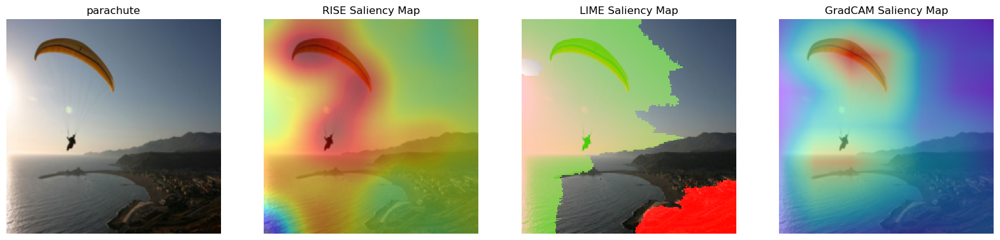

RISE


100%|██████████| 2000/2000 [01:28<00:00, 22.65it/s]


tensor([1.7932e-05, 1.7933e-05, 1.7934e-05,  ..., 1.5364e-05, 1.5350e-05,
        1.5337e-05])


100%|██████████| 502/502 [00:19<00:00, 25.93it/s]


LIME


  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([-1, -1, -1,  ...,  0,  0,  0])


100%|██████████| 502/502 [00:19<00:00, 25.78it/s]


GradCAM
tensor([0.3196, 0.3196, 0.3196,  ..., 0.2098, 0.2098, 0.2098],
       dtype=torch.float64)


100%|██████████| 502/502 [00:19<00:00, 25.38it/s]


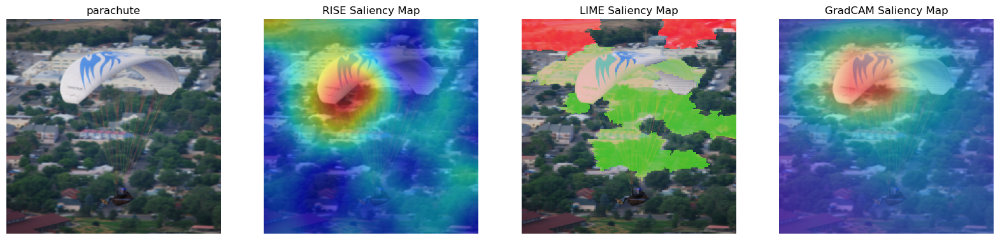

In [30]:
import limon
import torch.nn.functional as F
from torchvision.transforms import transforms
import gradcam
import rise

# Initialisation
labels = ['tench', 'dog', 'cassette player', 'chain saw', 'church', 'French horn', 'garbage truck', 'gas pump', 'golf ball', 'parachute']
mobileone_dict = {}

inv_normalize = transforms.Normalize(
   mean= [-m/s for m,s in zip(means, stds)],
   std= [1/s for s in stds]
)
#
#image = inv_normalize(image_example)
#
N = 2000
p = 0.5
images, _ = next(iter(testloader))
_, W, H = images[0].shape
masks = rise.generate_masks(N, p, H, W)


lime_transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(means, stds),
    ])

def batch_predict_mobileone(images):
  with torch.no_grad():
    model_mobileone.eval()
    batch = torch.stack(tuple(lime_transform(i) for i in images), dim=0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    batch = batch.to(device)
    logits = model_mobileone(batch)
  return logits.detach().cpu().numpy()

# Explanation analysis

for label in example_class_dict.keys() :
    lab = labels.index(label)
    class_dict = {}
    for i,img in enumerate(example_class_dict[label]) :
      image = inv_normalize(img)

      fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 5))
      ax1.imshow(image.permute(1, 2, 0).numpy())
      ax1.set_title(label)
      ax1.axis('off')

      print('RISE')
      metric_rise = rise.analysis(ax2, image, lab, model_mobileone, masks)
      print('LIME')
      metric_lime = limon.analysis(ax3, image, lab, model_mobileone, batch_predict_mobileone)
      print('GradCAM')
      hook_mobileone = gradcam.HookFeatures(model_mobileone.stage4[1].rbr_conv[0].conv)
      metric_gradcam = gradcam.analysis(ax4, image, lab, model_mobileone, hook_mobileone)
      hook_mobileone.close()

      example_dict = {'rise' : metric_rise,
                      'lime' : metric_lime,
                      'gradcam' : metric_gradcam
                    }

      plt.show()

      class_dict[i] = example_dict

    mobileone_dict[label] = class_dict

explanation_dict['mobileone'] = mobileone_dict

In [32]:
with open('explanation_dictionary.pkl', 'wb') as f:
    pickle.dump(explanation_dict, f)

#### 5.3. Our analysis of given explanations

We can see that for the two models we have pretty similar importance maps for the 3 explaination metrics. This behaviour might be due to the same fine tuning process on the same training dataset for the two models. Furthermore, the two models have been pretrained on the same dataset : Imagenet. Thus they might recognize very similar features inside of each images.

We will try to analyse the importance maps given with the 3 explanation methods for the 3 labels :

* **Dog class** : 
1. It looks like black dogs parts are not so well recognized but white and mixed color parts seem well recognized. The dataset might have not enough black dogs
2. When covered with plants, dogs are not recognized : the dataset might have not enough dogs in the bush or partially behind other elements.
3. Muzzle and eyes are not always important for the recognition but the models seem to focus more on hair contours and texture (principally where there are mixed colors). The dataset seem to have not enough dogs from front view and have too much mixed colors of hair.
4. The background seems to influence the predictions : dogs images might be all taken in houses or gardens which make the background influent on classification.


* **Church class** :
1. Models focus principally on altar, bell tower and roof.
2. However, architecture ornaments (sculptures, stained glass windows...) do not seem to influence predictions. Those features might lack in the dataset (churches with ornaments in the foreground)


* **Parachute class** :
1. Models focus principally on ropes, parachutist and parachute canvas edges.
2. Also, the landscape background seems also influence the prediction : there might be a lot of parachute images in the dataset which represent a landscape.
3. The parachute canvas does not result important in saliency maps but the edges are, the models mainly focus on the shape of the canvas (sharp corners and rounded shape)